<a href="https://colab.research.google.com/github/MrDio/ImageProcessingInCloudColab/blob/main/Image_Processing_in_the_Cloud.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Processing in the Cloud
This notebook is a demo for outsourcing the image processing task to a cloud. 

The Requirements are to reach a Round-Trip time of < 1 Sec +-0,5 sec

In [ ]:
# import dependencies
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from google.colab.patches import cv2_imshow
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time
import matplotlib.pyplot as plt
import time
import urllib3

%matplotlib inline

## Cloning and Setting Up Darknet for YOLOv4
We will be using the famous AlexeyAB's darknet repository in this tutorial to perform YOLOv4 detections.

In [ ]:
# clone darknet repo
!git clone https://github.com/AlexeyAB/darknet

Cloning into 'darknet'...
remote: Enumerating objects: 15208, done.
remote: Counting objects: 100% (23/23), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 15208 (delta 12), reused 19 (delta 12), pack-reused 15185
Receiving objects: 100% (15208/15208), 13.63 MiB | 16.42 MiB/s, done.
Resolving deltas: 100% (10322/10322), done.


In [ ]:
# change makefile to have GPU, OPENCV and LIBSO enabled
%cd darknet
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile
!sed -i 's/CUDNN_HALF=0/CUDNN_HALF=1/' Makefile
!sed -i 's/LIBSO=0/LIBSO=1/' Makefile

/content/darknet


In [ ]:
# make darknet (builds darknet so that you can then use the darknet.py file and have its dependencies)
!make

mkdir -p ./obj/
mkdir -p backup
chmod +x *.sh
g++ -std=c++11 -std=c++11 -Iinclude/ -I3rdparty/stb/include -DGPU -I/usr/local/cuda/include/ -DCUDNN -DCUDNN_HALF -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -Ofast -DGPU -DCUDNN -I/usr/local/cudnn/include -DCUDNN_HALF -fPIC -c ./src/image_opencv.cpp -o obj/image_opencv.o
g++ -std=c++11 -std=c++11 -Iinclude/ -I3rdparty/stb/include -DGPU -I/usr/local/cuda/include/ -DCUDNN -DCUDNN_HALF -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -Ofast -DGPU -DCUDNN -I/usr/local/cudnn/include -DCUDNN_HALF -fPIC -c ./src/http_stream.cpp -o obj/http_stream.o
./src/http_stream.cpp: In member function ‘bool JSON_sender::write(const char*)’:
./src/http_stream.cpp:253:21: warning: unused variable ‘n’ [-Wunused-variable]
                 int n = _write(client, outputbuf, outlen);
                     ^
./src/http_stream.cpp: In function ‘void set_track_id(detection*, int, float, float, float, int, int, int)’:
./src/http_

In [ ]:
# get bthe scaled yolov4 weights file that is pre-trained to detect 80 classes (objects) from shared google drive
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1V3vsIaxAlGWvK4Aar9bAiK5U0QFttKwq' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1V3vsIaxAlGWvK4Aar9bAiK5U0QFttKwq" -O yolov4-csp.weights && rm -rf /tmp/cookies.txt

--2021-06-23 13:34:53--  https://docs.google.com/uc?export=download&confirm=O87T&id=1V3vsIaxAlGWvK4Aar9bAiK5U0QFttKwq
Resolving docs.google.com (docs.google.com)... 64.233.166.102, 64.233.166.113, 64.233.166.101, ...
Connecting to docs.google.com (docs.google.com)|64.233.166.102|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-00-as-docs.googleusercontent.com/docs/securesc/o6lpfodk7j4as7ur14gd1gaqkald51nj/r82a7n1lnjt3k3isubmilf0o6eiooh92/1624455225000/17800843676226924807/15749915889208740030Z/1V3vsIaxAlGWvK4Aar9bAiK5U0QFttKwq?e=download [following]
--2021-06-23 13:34:53--  https://doc-00-as-docs.googleusercontent.com/docs/securesc/o6lpfodk7j4as7ur14gd1gaqkald51nj/r82a7n1lnjt3k3isubmilf0o6eiooh92/1624455225000/17800843676226924807/15749915889208740030Z/1V3vsIaxAlGWvK4Aar9bAiK5U0QFttKwq?e=download
Resolving doc-00-as-docs.googleusercontent.com (doc-00-as-docs.googleusercontent.com)... 173.194.76.132, 2a00:1450:400c:c00::84
Connecting

## Darknet for Python
In order to utilize YOLOv4 with Python code we will use some of the pre-built functions found within darknet.py by importing the functions into our workstation. Feel free to checkout the darknet.py file to see the function definitions in detail! 

In [ ]:
# import darknet functions to perform object detections
from darknet import *
# load in our YOLOv4 architecture network
network, class_names, class_colors = load_network("cfg/yolov4-csp.cfg", "cfg/coco.data", "yolov4-csp.weights")
width = network_width(network)
height = network_height(network)

# darknet helper function to run detection on image
def darknet_helper(img, width, height):
  darknet_image = make_image(width, height, 3)
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img_resized = cv2.resize(img_rgb, (width, height),
                              interpolation=cv2.INTER_LINEAR)

  # get image ratios to convert bounding boxes to proper size
  img_height, img_width, _ = img.shape
  width_ratio = img_width/width
  height_ratio = img_height/height

  # run model on darknet style image to get detections
  copy_image_from_bytes(darknet_image, img_resized.tobytes())
  detections = detect_image(network, class_names, darknet_image)
  free_image(darknet_image)
  return detections, width_ratio, height_ratio

## Processing Loop with N=10 Imgs and exec-time calculation


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i1.jpg is None
../drive/MyDrive/Img/in/i

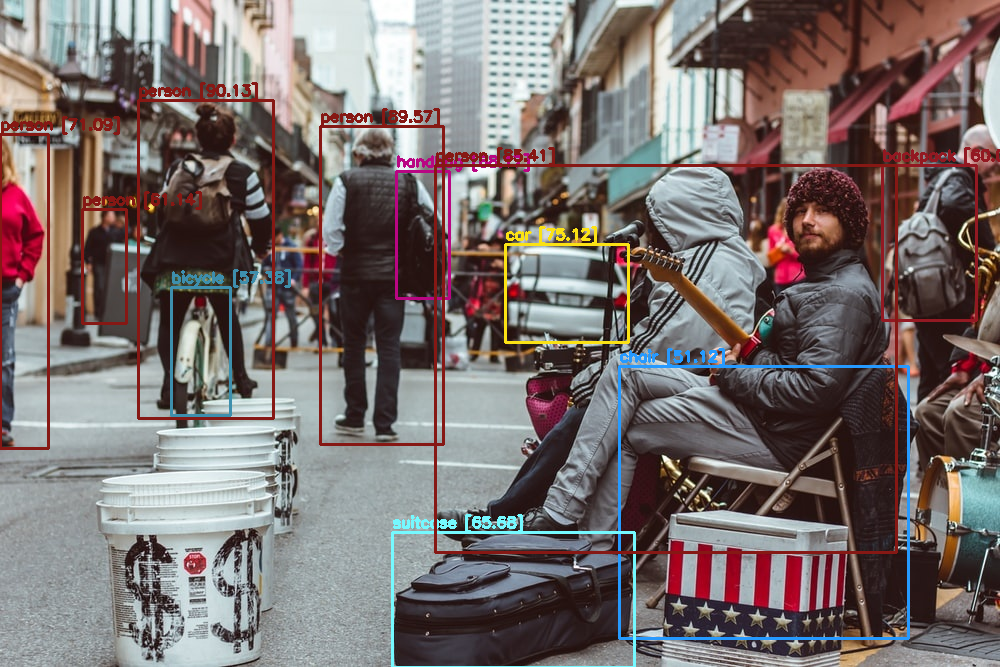

Cloud timer: 117.95724964141846 seconds
Processing time: ../drive/MyDrive/Img/in/i1.jpg 1.423879623413086 seconds
Inference time: ../drive/MyDrive/Img/in/i1.jpg 0.11705207824707031 seconds
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg is None
../drive/MyDrive/Img/in/i2.jpg 

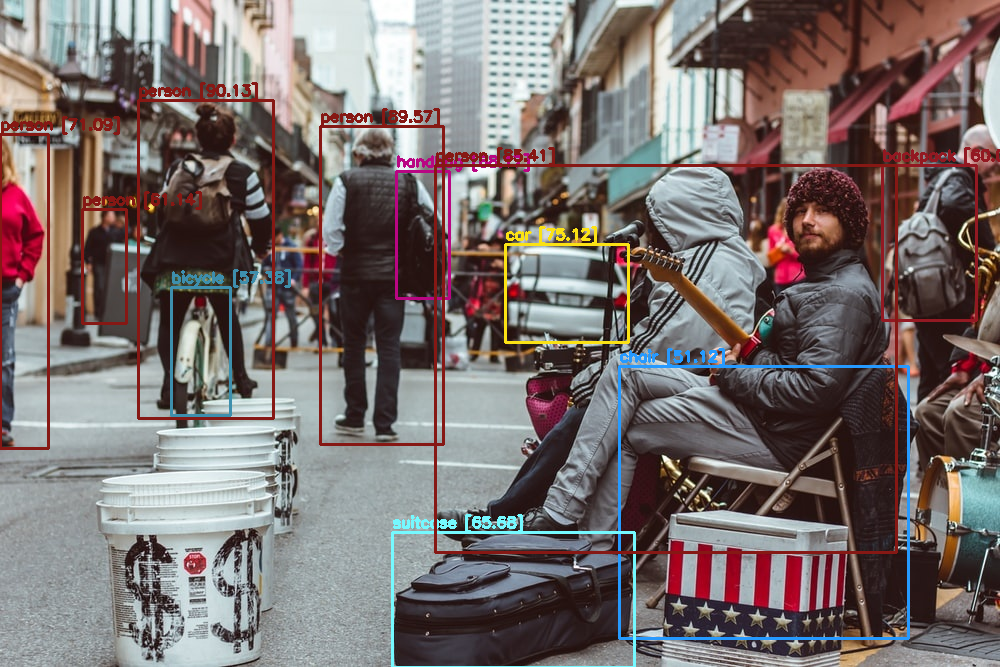

Cloud timer: 159.7569465637207 seconds
Processing time: ../drive/MyDrive/Img/in/i2.jpg 1.4173729419708252 seconds
Inference time: ../drive/MyDrive/Img/in/i2.jpg 0.11745834350585938 seconds
../drive/MyDrive/Img/in/i3.jpg is None
../drive/MyDrive/Img/in/i3.jpg is None
../drive/MyDrive/Img/in/i3.jpg is None
../drive/MyDrive/Img/in/i3.jpg is None
../drive/MyDrive/Img/in/i3.jpg is None
../drive/MyDrive/Img/in/i3.jpg is None
../drive/MyDrive/Img/in/i3.jpg is None
../drive/MyDrive/Img/in/i3.jpg is None
../drive/MyDrive/Img/in/i3.jpg is None
../drive/MyDrive/Img/in/i3.jpg is None
../drive/MyDrive/Img/in/i3.jpg is None
../drive/MyDrive/Img/in/i3.jpg is None
../drive/MyDrive/Img/in/i3.jpg is None
../drive/MyDrive/Img/in/i3.jpg is None
../drive/MyDrive/Img/in/i3.jpg is None
../drive/MyDrive/Img/in/i3.jpg is None
../drive/MyDrive/Img/in/i3.jpg is None
../drive/MyDrive/Img/in/i3.jpg is None


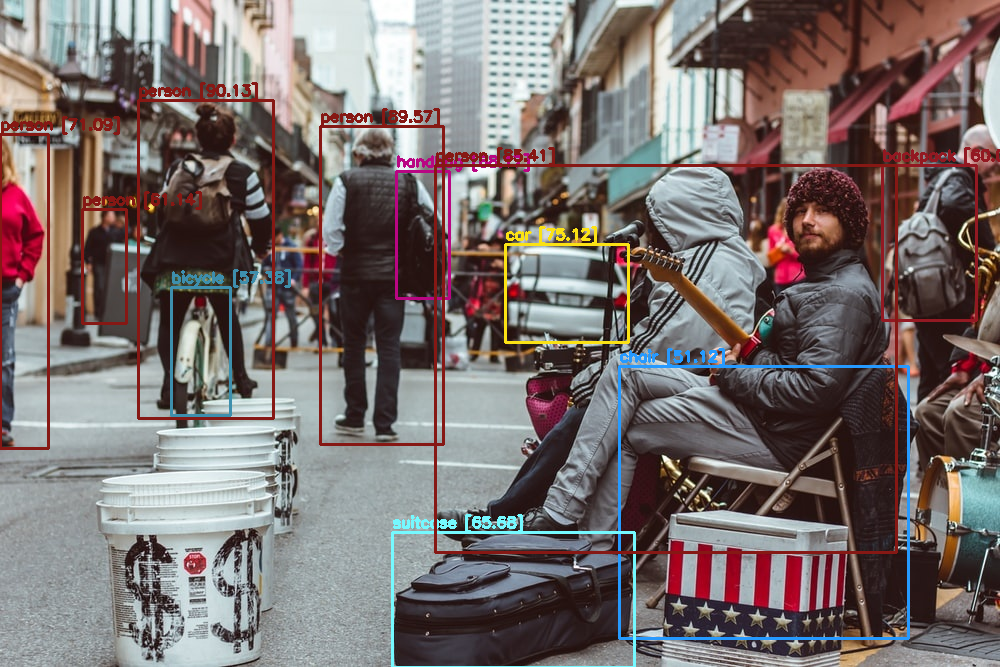

Cloud timer: 180.48050904273987 seconds
Processing time: ../drive/MyDrive/Img/in/i3.jpg 1.4165070056915283 seconds
Inference time: ../drive/MyDrive/Img/in/i3.jpg 0.11681079864501953 seconds
../drive/MyDrive/Img/in/i4.jpg is None
../drive/MyDrive/Img/in/i4.jpg is None
../drive/MyDrive/Img/in/i4.jpg is None
../drive/MyDrive/Img/in/i4.jpg is None
../drive/MyDrive/Img/in/i4.jpg is None
../drive/MyDrive/Img/in/i4.jpg is None
../drive/MyDrive/Img/in/i4.jpg is None
../drive/MyDrive/Img/in/i4.jpg is None
../drive/MyDrive/Img/in/i4.jpg is None
../drive/MyDrive/Img/in/i4.jpg is None
../drive/MyDrive/Img/in/i4.jpg is None
../drive/MyDrive/Img/in/i4.jpg is None
../drive/MyDrive/Img/in/i4.jpg is None
../drive/MyDrive/Img/in/i4.jpg is None
../drive/MyDrive/Img/in/i4.jpg is None
../drive/MyDrive/Img/in/i4.jpg is None
../drive/MyDrive/Img/in/i4.jpg is None
../drive/MyDrive/Img/in/i4.jpg is None


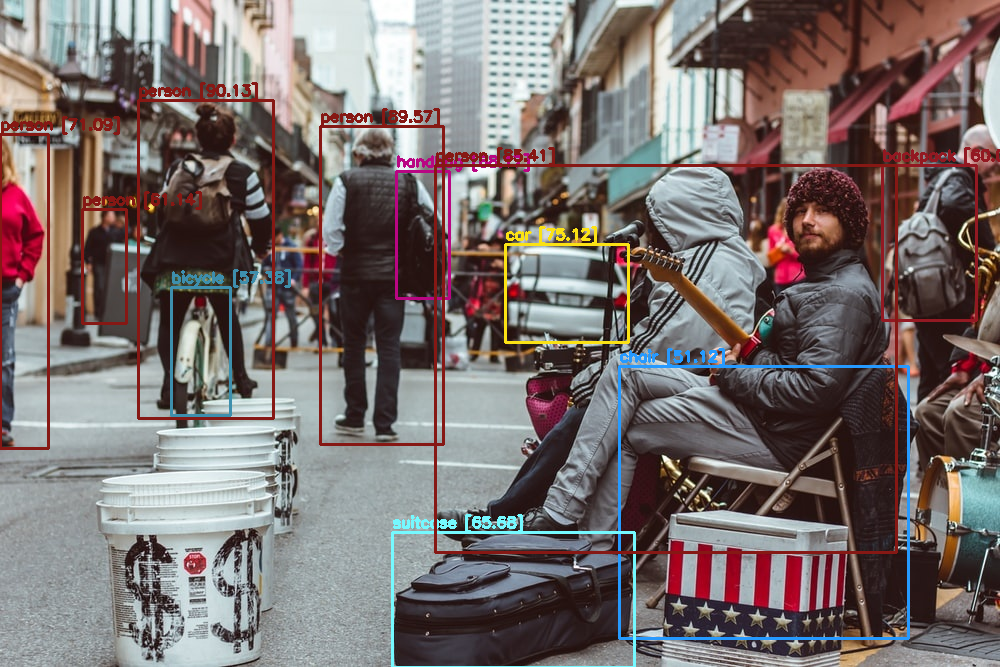

Cloud timer: 201.4327437877655 seconds
Processing time: ../drive/MyDrive/Img/in/i4.jpg 1.4200077056884766 seconds
Inference time: ../drive/MyDrive/Img/in/i4.jpg 0.11743950843811035 seconds
../drive/MyDrive/Img/in/i5.jpg is None
../drive/MyDrive/Img/in/i5.jpg is None
../drive/MyDrive/Img/in/i5.jpg is None
../drive/MyDrive/Img/in/i5.jpg is None
../drive/MyDrive/Img/in/i5.jpg is None
../drive/MyDrive/Img/in/i5.jpg is None
../drive/MyDrive/Img/in/i5.jpg is None
../drive/MyDrive/Img/in/i5.jpg is None
../drive/MyDrive/Img/in/i5.jpg is None
../drive/MyDrive/Img/in/i5.jpg is None
../drive/MyDrive/Img/in/i5.jpg is None
../drive/MyDrive/Img/in/i5.jpg is None
../drive/MyDrive/Img/in/i5.jpg is None
../drive/MyDrive/Img/in/i5.jpg is None
../drive/MyDrive/Img/in/i5.jpg is None
../drive/MyDrive/Img/in/i5.jpg is None
../drive/MyDrive/Img/in/i5.jpg is None
../drive/MyDrive/Img/in/i5.jpg is None


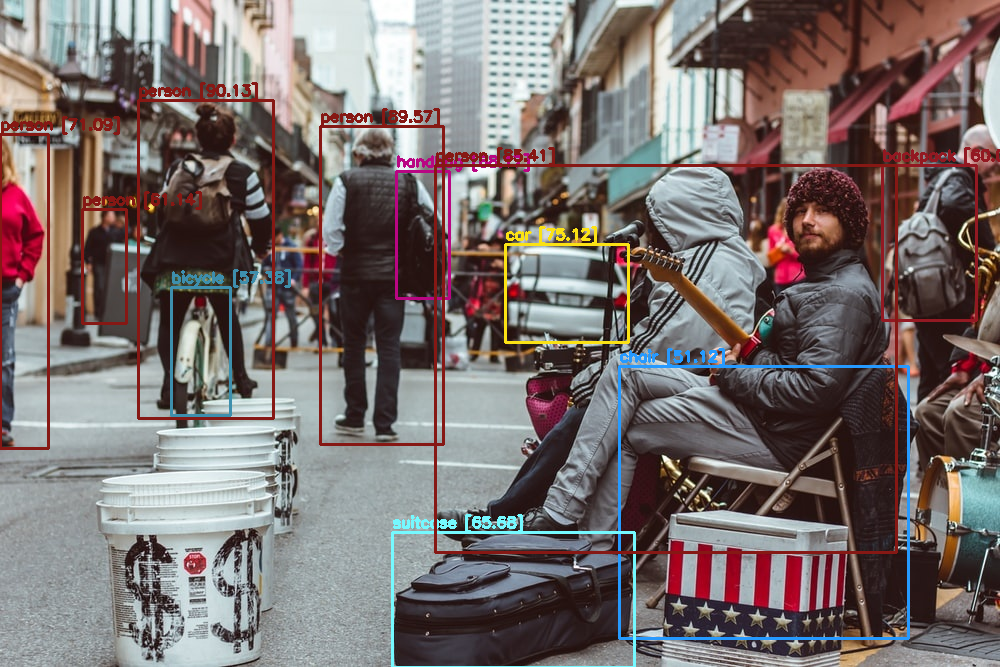

Cloud timer: 221.30463242530823 seconds
Processing time: ../drive/MyDrive/Img/in/i5.jpg 1.4225263595581055 seconds
Inference time: ../drive/MyDrive/Img/in/i5.jpg 0.1168515682220459 seconds
../drive/MyDrive/Img/in/i6.jpg is None
../drive/MyDrive/Img/in/i6.jpg is None
../drive/MyDrive/Img/in/i6.jpg is None
../drive/MyDrive/Img/in/i6.jpg is None
../drive/MyDrive/Img/in/i6.jpg is None
../drive/MyDrive/Img/in/i6.jpg is None
../drive/MyDrive/Img/in/i6.jpg is None
../drive/MyDrive/Img/in/i6.jpg is None
../drive/MyDrive/Img/in/i6.jpg is None
../drive/MyDrive/Img/in/i6.jpg is None
../drive/MyDrive/Img/in/i6.jpg is None
../drive/MyDrive/Img/in/i6.jpg is None
../drive/MyDrive/Img/in/i6.jpg is None
../drive/MyDrive/Img/in/i6.jpg is None
../drive/MyDrive/Img/in/i6.jpg is None
../drive/MyDrive/Img/in/i6.jpg is None
../drive/MyDrive/Img/in/i6.jpg is None
../drive/MyDrive/Img/in/i6.jpg is None
../drive/MyDrive/Img/in/i6.jpg is None


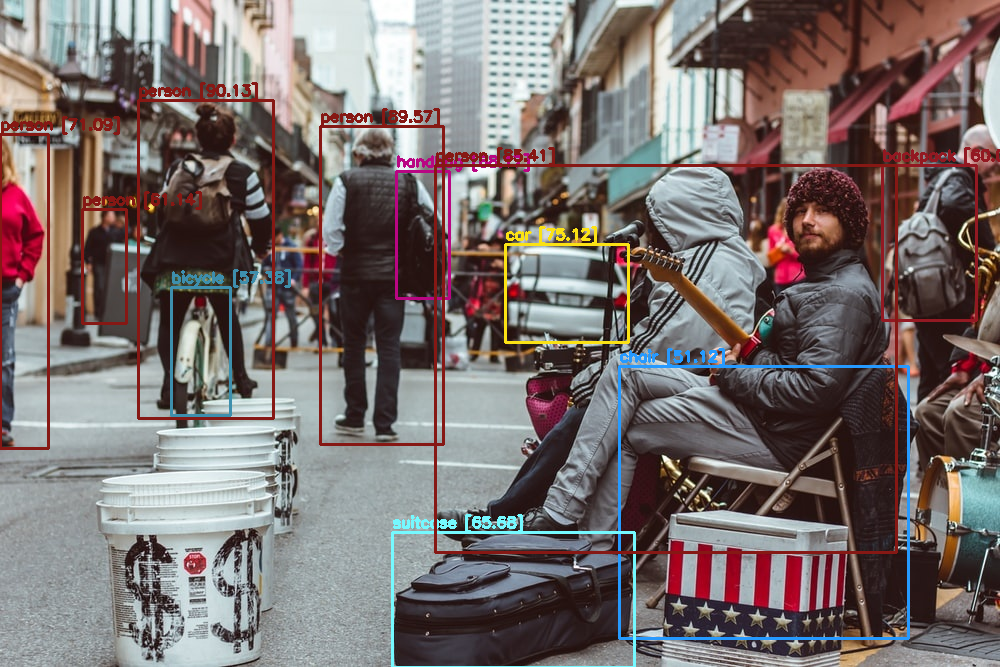

Cloud timer: 242.19202423095703 seconds
Processing time: ../drive/MyDrive/Img/in/i6.jpg 1.4137206077575684 seconds
Inference time: ../drive/MyDrive/Img/in/i6.jpg 0.11664533615112305 seconds
../drive/MyDrive/Img/in/i7.jpg is None
../drive/MyDrive/Img/in/i7.jpg is None
../drive/MyDrive/Img/in/i7.jpg is None
../drive/MyDrive/Img/in/i7.jpg is None
../drive/MyDrive/Img/in/i7.jpg is None
../drive/MyDrive/Img/in/i7.jpg is None
../drive/MyDrive/Img/in/i7.jpg is None
../drive/MyDrive/Img/in/i7.jpg is None
../drive/MyDrive/Img/in/i7.jpg is None
../drive/MyDrive/Img/in/i7.jpg is None
../drive/MyDrive/Img/in/i7.jpg is None
../drive/MyDrive/Img/in/i7.jpg is None
../drive/MyDrive/Img/in/i7.jpg is None
../drive/MyDrive/Img/in/i7.jpg is None
../drive/MyDrive/Img/in/i7.jpg is None
../drive/MyDrive/Img/in/i7.jpg is None
../drive/MyDrive/Img/in/i7.jpg is None
../drive/MyDrive/Img/in/i7.jpg is None
../drive/MyDrive/Img/in/i7.jpg is None


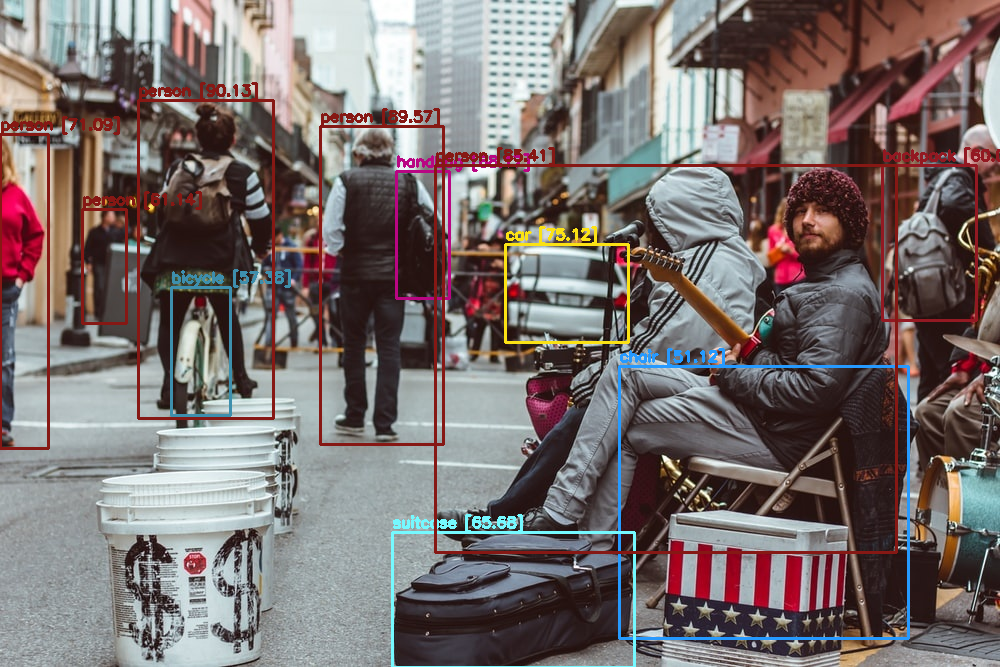

Cloud timer: 262.9485204219818 seconds
Processing time: ../drive/MyDrive/Img/in/i7.jpg 1.4244835376739502 seconds
Inference time: ../drive/MyDrive/Img/in/i7.jpg 0.11814165115356445 seconds
../drive/MyDrive/Img/in/i8.jpg is None
../drive/MyDrive/Img/in/i8.jpg is None
../drive/MyDrive/Img/in/i8.jpg is None
../drive/MyDrive/Img/in/i8.jpg is None
../drive/MyDrive/Img/in/i8.jpg is None
../drive/MyDrive/Img/in/i8.jpg is None
../drive/MyDrive/Img/in/i8.jpg is None
../drive/MyDrive/Img/in/i8.jpg is None
../drive/MyDrive/Img/in/i8.jpg is None
../drive/MyDrive/Img/in/i8.jpg is None
../drive/MyDrive/Img/in/i8.jpg is None
../drive/MyDrive/Img/in/i8.jpg is None
../drive/MyDrive/Img/in/i8.jpg is None
../drive/MyDrive/Img/in/i8.jpg is None
../drive/MyDrive/Img/in/i8.jpg is None
../drive/MyDrive/Img/in/i8.jpg is None
../drive/MyDrive/Img/in/i8.jpg is None
../drive/MyDrive/Img/in/i8.jpg is None
../drive/MyDrive/Img/in/i8.jpg is None


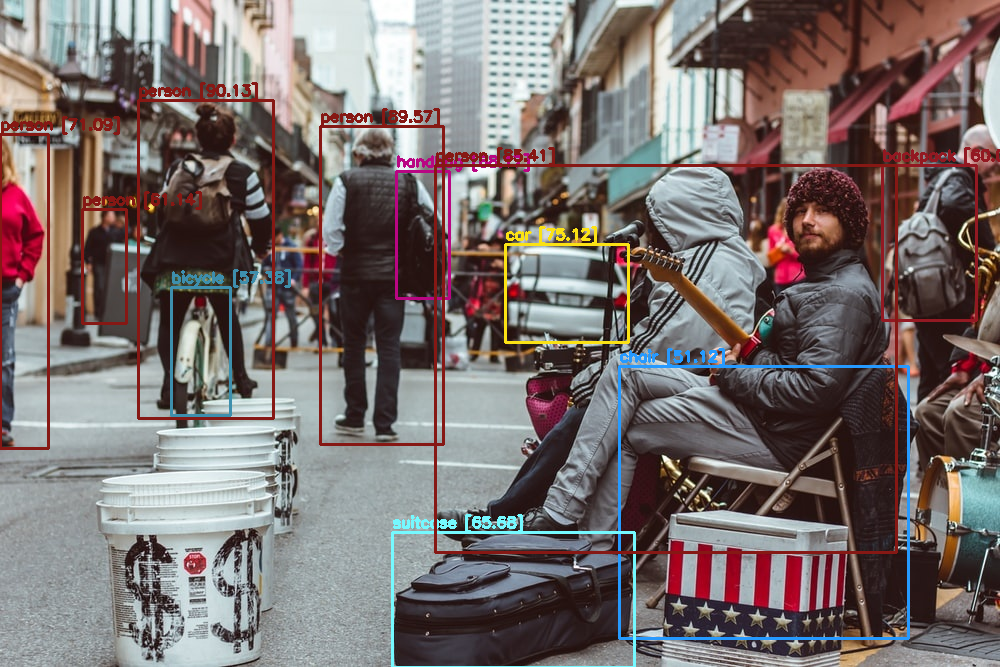

Cloud timer: 283.8365070819855 seconds
Processing time: ../drive/MyDrive/Img/in/i8.jpg 1.4090628623962402 seconds
Inference time: ../drive/MyDrive/Img/in/i8.jpg 0.11701226234436035 seconds
../drive/MyDrive/Img/in/i9.jpg is None
../drive/MyDrive/Img/in/i9.jpg is None
../drive/MyDrive/Img/in/i9.jpg is None
../drive/MyDrive/Img/in/i9.jpg is None
../drive/MyDrive/Img/in/i9.jpg is None
../drive/MyDrive/Img/in/i9.jpg is None
../drive/MyDrive/Img/in/i9.jpg is None
../drive/MyDrive/Img/in/i9.jpg is None
../drive/MyDrive/Img/in/i9.jpg is None
../drive/MyDrive/Img/in/i9.jpg is None
../drive/MyDrive/Img/in/i9.jpg is None
../drive/MyDrive/Img/in/i9.jpg is None
../drive/MyDrive/Img/in/i9.jpg is None
../drive/MyDrive/Img/in/i9.jpg is None
../drive/MyDrive/Img/in/i9.jpg is None
../drive/MyDrive/Img/in/i9.jpg is None
../drive/MyDrive/Img/in/i9.jpg is None
../drive/MyDrive/Img/in/i9.jpg is None


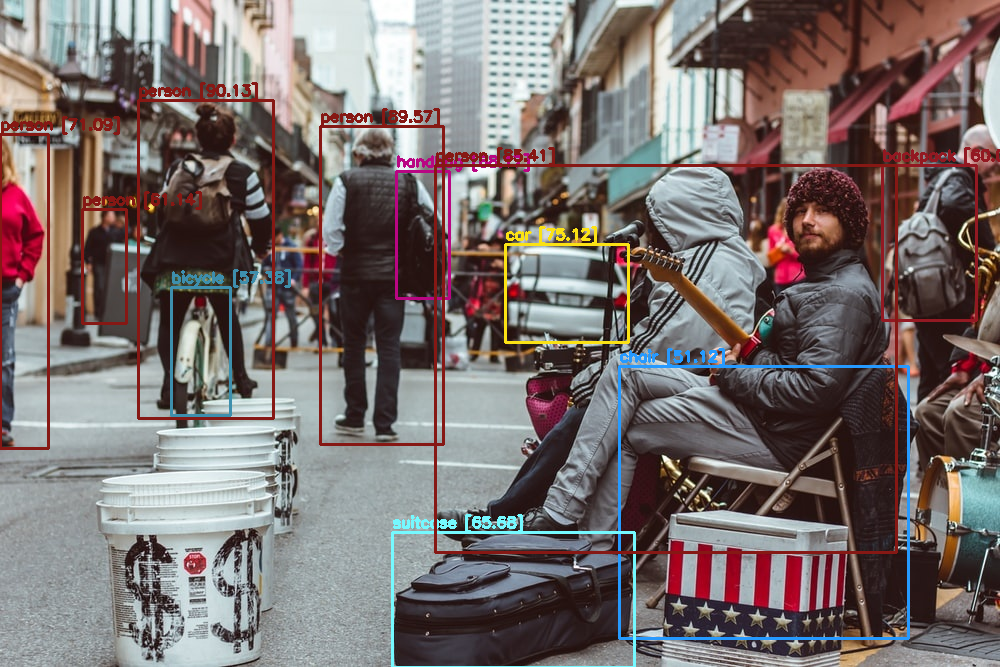

Cloud timer: 303.86825704574585 seconds
Processing time: ../drive/MyDrive/Img/in/i9.jpg 1.412154197692871 seconds
Inference time: ../drive/MyDrive/Img/in/i9.jpg 0.11728549003601074 seconds


In [ ]:
cloud_timer_start = time.time()
cloud_timer = 0

for i in range(1,10):

  tmp_in_img = "../drive/MyDrive/Img/in/i"+str(i)+".jpg"
  tmp_out_img = "../drive/MyDrive/Img/out/o"+str(i)+".jpg"

  image = None

  while image is None:
    image = cv2.imread(tmp_in_img)
    print(tmp_in_img+" is None")
    time.sleep(1)
    continue;

    
  start_cloud_Img = time.time()

  start_predict_Img = time.time()

  detections, width_ratio, height_ratio = darknet_helper(image, width, height)

  end_predict_Img = time.time()

  for label, confidence, bbox in detections:
    left, top, right, bottom = bbox2points(bbox)
    left, top, right, bottom = int(left * width_ratio), int(top * height_ratio), int(right * width_ratio), int(bottom * height_ratio)
    cv2.rectangle(image, (left, top), (right, bottom), class_colors[label], 2)
    cv2.putText(image, "{} [{:.2f}]".format(label, float(confidence)),
                      (left, top - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                      class_colors[label], 2)
  cv2_imshow(image)
  cv2.imwrite(tmp_out_img, image)

  time.sleep(1)

  end_cloud_Img = time.time()

  cloud_timer = time.time() - cloud_timer_start

  print(f"Cloud timer: {cloud_timer} seconds")
  print(f"Processing time: {tmp_in_img} {end_cloud_Img - start_cloud_Img} seconds")
  print(f"Inference time: {tmp_in_img} {end_predict_Img - start_predict_Img} seconds")